In [104]:
import pandas as pd
import seaborn as sns
import ast
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [105]:
dataset_evals = pd.read_csv('./dataset_evaluations_with_differences_aggregated.csv')

In [106]:
dataset_evals.loc[dataset_evals.model == 'squad_base', 'model'] = 'baseline'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_all', 'model'] = 'all heuristics'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_ans_cos', 'model'] = 'ans len + cos sim'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_ans_sub_pos_1', 'model'] = 'subject position'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_answer_length_3', 'model'] = 'answer length'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_cosine_similarity_01', 'model'] = 'cosine similarity'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_dist_ans', 'model'] = 'w dist + ans len'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_dist_cos', 'model'] = 'w dist + cos sim'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_distances_7', 'model'] = 'word distances'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_similar_entities_0', 'model'] = 'similar entities'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_similar_words_4', 'model'] = 'similar words'
dataset_evals.loc[dataset_evals.model == 'squad_supersampled_top_3', 'model'] = 'top 3'


In [107]:
dataset_evals

,dataset,model,exact_match,em_diff_from_base,f1,f1_diff_from_base,em_diff,f1_diff
0,AdversarialQA,baseline,19.233333,-0.633333,30.232718,-1.066529,0.000000,0.000000
1,AdversarialQA,all heuristics,18.611111,-1.255556,30.157232,-1.142016,-0.622222,-0.075486
2,AdversarialQA,ans len + cos sim,18.466667,-1.400000,30.079666,-1.219581,-0.766666,-0.153052
3,AdversarialQA,subject position,16.650000,-3.216667,27.617018,-3.682229,-2.583333,-2.615700
4,AdversarialQA,answer length,16.816667,-3.050000,29.229460,-2.069787,-2.416666,-1.003258
5,AdversarialQA,cosine similarity,18.383333,-1.483333,29.615994,-1.683253,-0.850000,-0.616724
6,AdversarialQA,w dist + ans len,18.533333,-1.333333,30.473379,-0.825868,-0.700000,0.240661
7,AdversarialQA,w dist + cos sim,18.616667,-1.250000,29.471279,-1.827968,-0.616666,-0.761439
8,AdversarialQA,word distances,18.533333,-1.333333,30.208991,-1.090256,-0.700000,-0.023727
9,AdversarialQA,similar entities,19.500000,-0.366667,30.679748,-0.619499,0.266667,0.447030


In [108]:
pd.crosstab(dataset_evals['model'], dataset_evals['dataset'], values=dataset_evals.em_diff, aggfunc='mean')

dataset,AdversarialQA,NaturalQuestions,SQuAD,TriviaQA
model,,,,
all heuristics,-0.622222,0.608376,-0.961842,-1.559057
ans len + cos sim,-0.766666,-3.381437,-0.911384,-0.896458
answer length,-2.416666,-5.461234,-1.980448,-2.670733
baseline,0.000000,0.000000,0.000000,0.000000
cosine similarity,-0.850000,1.690719,-0.892463,-2.075919
similar entities,0.266667,2.009055,0.186061,-0.586341
similar words,-0.800000,0.608376,-0.627562,0.501610
subject position,-2.583333,-0.304188,-2.391990,-2.584307
top 3,-1.016666,-0.304188,-1.777042,-0.942213


In [109]:
pd.crosstab(dataset_evals['model'], dataset_evals['dataset'], values=dataset_evals.f1_diff, aggfunc='mean')

dataset,AdversarialQA,NaturalQuestions,SQuAD,TriviaQA
model,,,,
all heuristics,-0.075486,0.620551,-0.431647,-1.327718
ans len + cos sim,-0.153052,-2.013250,-0.302007,-0.405837
answer length,-1.003258,-3.845592,-0.695835,-1.969889
baseline,0.000000,0.000000,0.000000,0.000000
cosine similarity,-0.616724,0.805291,-0.532467,-1.959945
similar entities,0.447030,1.548146,0.219412,-0.578036
similar words,-0.220964,1.038531,-0.338127,1.054733
subject position,-2.615700,-0.025870,-1.662315,-2.479371
top 3,-0.159672,-0.115848,-1.040211,-0.577837


Text(0.5, 1.0, 'Exact match in percentage on SQuAD')

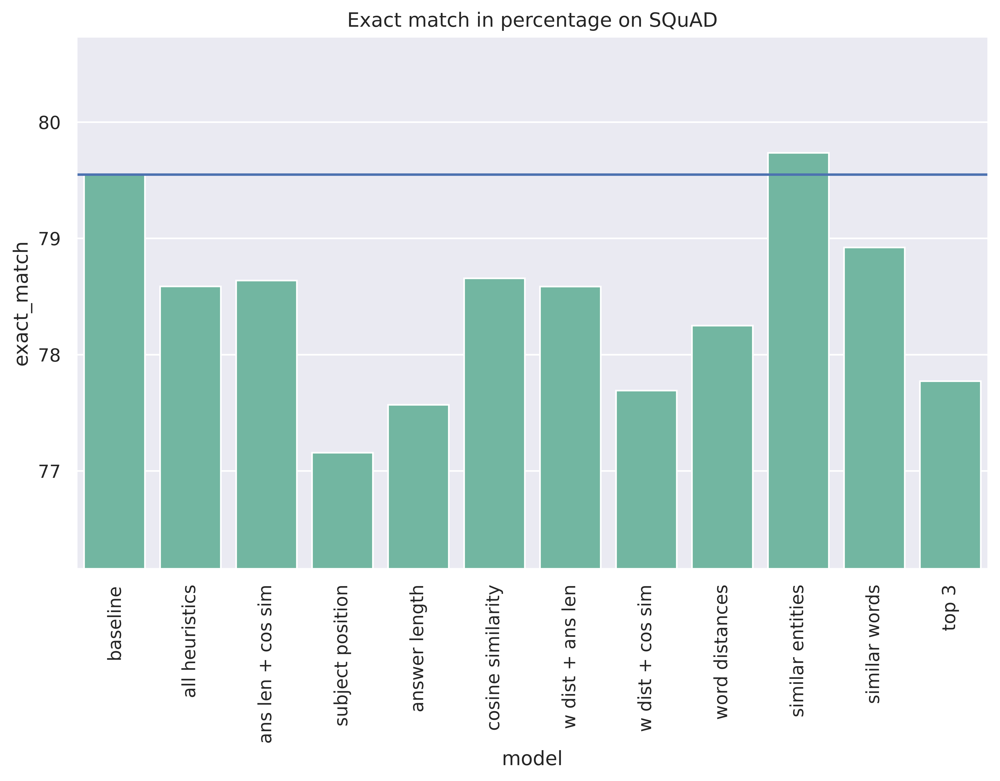

In [110]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="exact_match", data=dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'SQuAD') & (dataset_evals['model'] == 'baseline')]['exact_match'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD']['exact_match'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD']['exact_match'].max() + 1)
plt.title('Exact match in percentage on SQuAD')

# dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD']
# dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA']
# dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions']
# dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA']

Text(0.5, 1.0, 'Exact match in percentage on AdversarialQA')

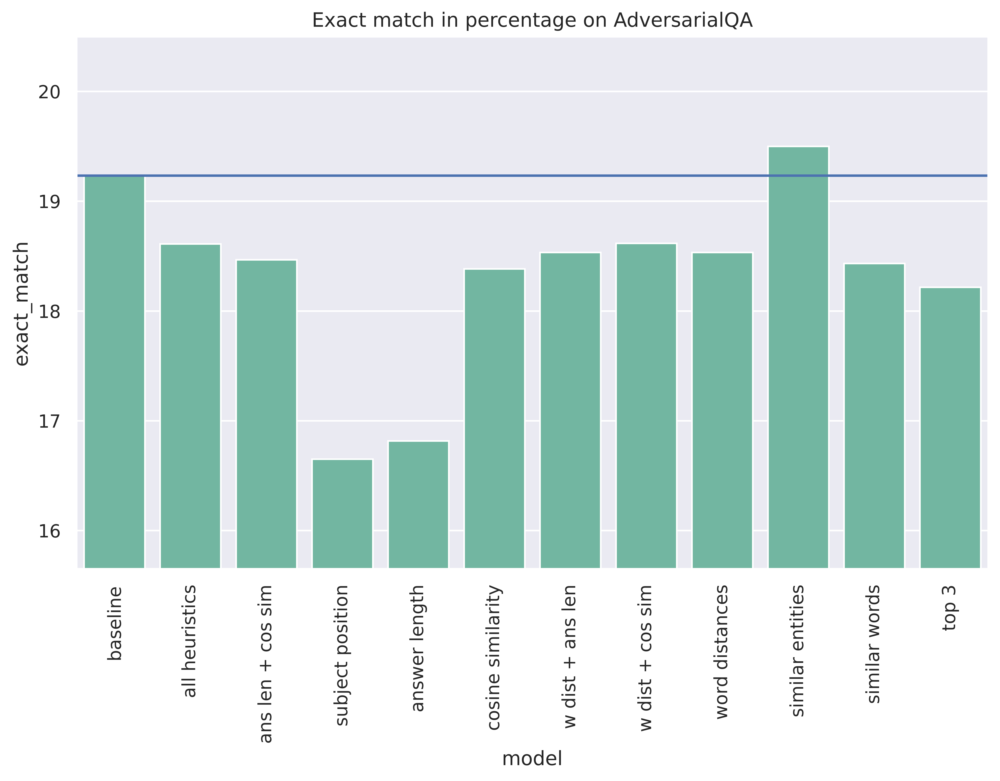

In [111]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="exact_match", data=dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'AdversarialQA') & (dataset_evals['model'] == 'baseline')]['exact_match'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA']['exact_match'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA']['exact_match'].max() + 1)
plt.title('Exact match in percentage on AdversarialQA')

Text(0.5, 1.0, 'Exact match in percentage on NaturalQuestions')

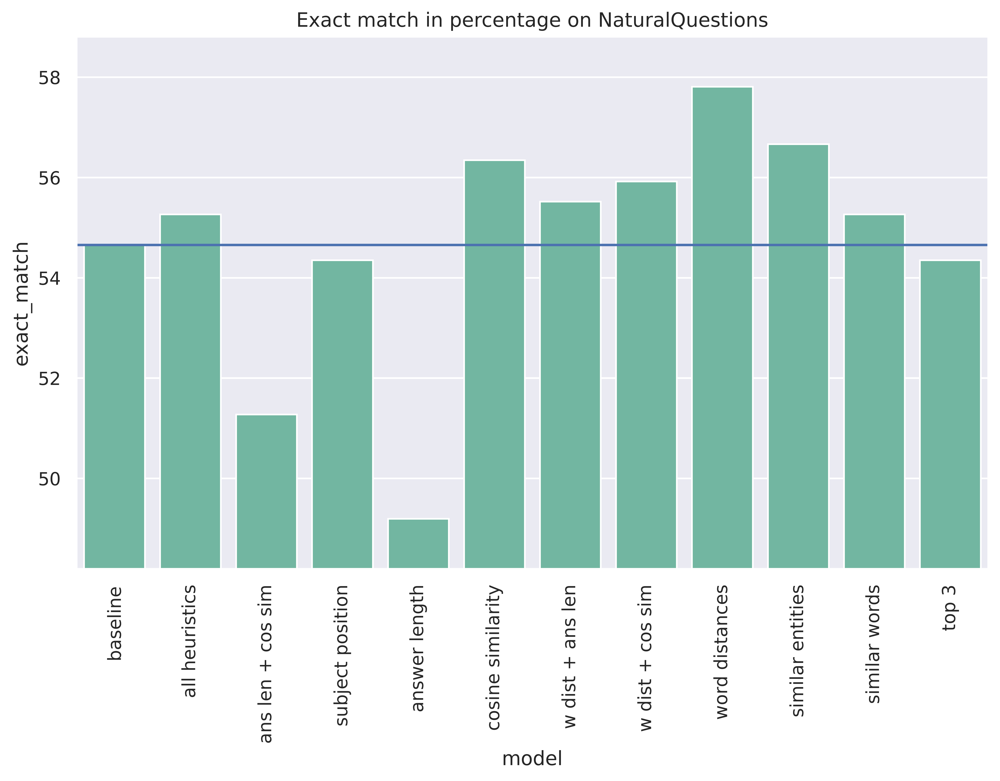

In [112]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="exact_match", data=dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'NaturalQuestions') & (dataset_evals['model'] == 'baseline')]['exact_match'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions']['exact_match'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions']['exact_match'].max() + 1)
plt.title('Exact match in percentage on NaturalQuestions')

Text(0.5, 1.0, 'Exact match in percentage on TriviaQA')

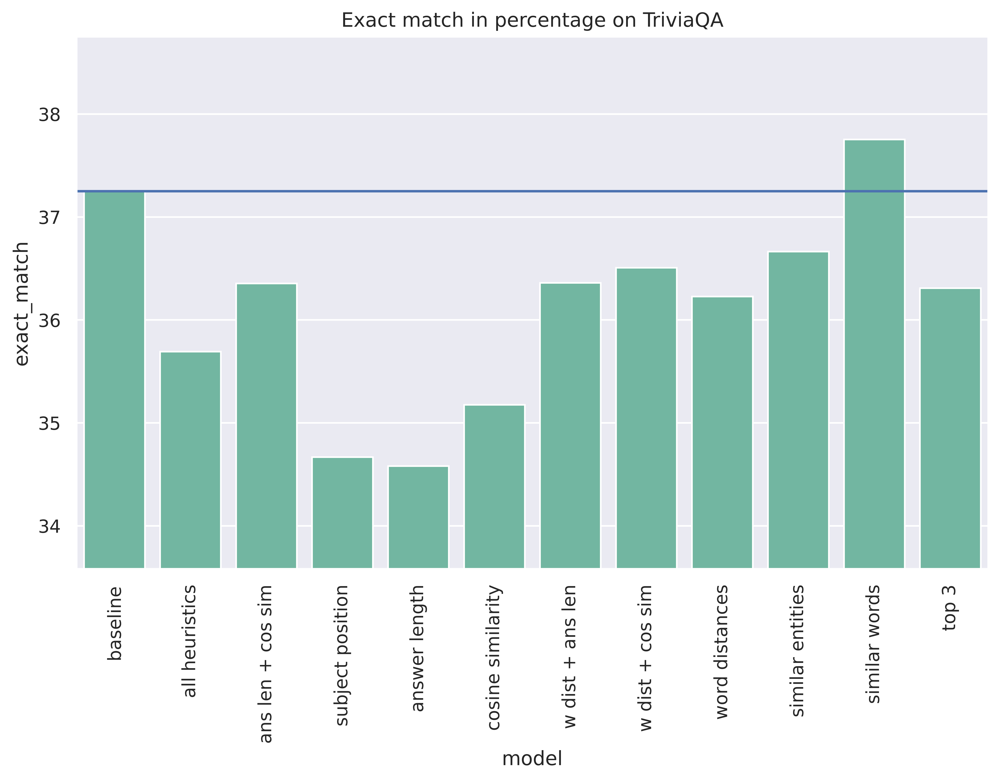

In [113]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="exact_match", data=dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'TriviaQA') & (dataset_evals['model'] == 'baseline')]['exact_match'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA']['exact_match'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA']['exact_match'].max() + 1)
plt.title('Exact match in percentage on TriviaQA')

Text(0.5, 1.0, 'F1 in percentage on SQuAD')

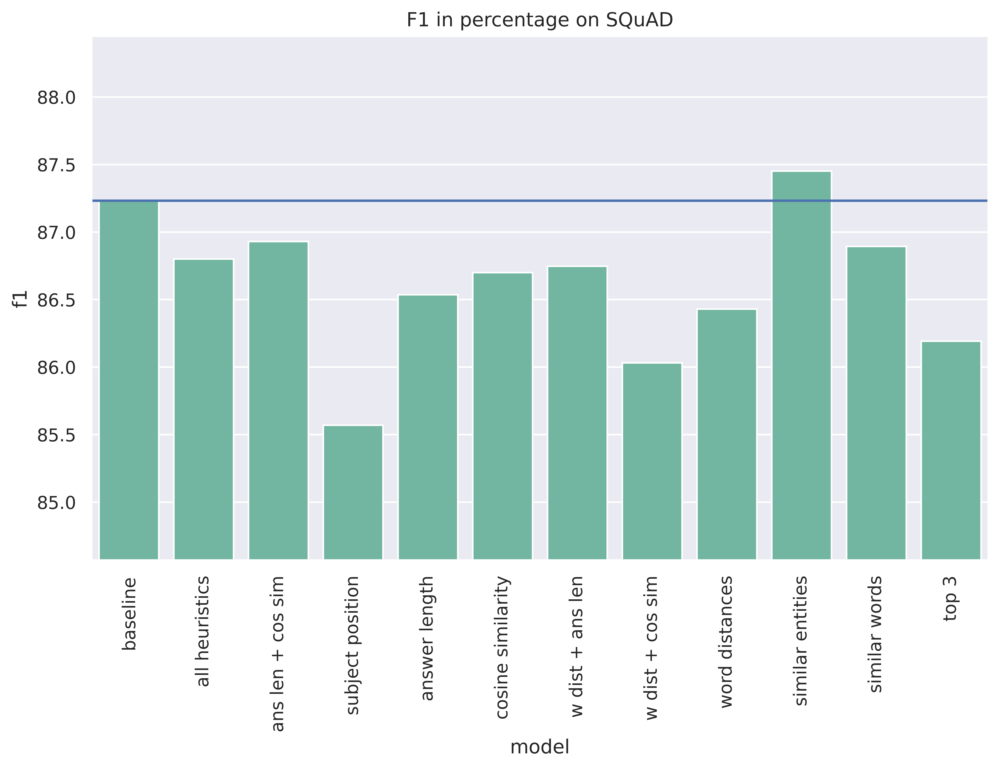

In [114]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="f1", data=dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'SQuAD') & (dataset_evals['model'] == 'baseline')]['f1'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD']['f1'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'SQuAD']['f1'].max() + 1)
plt.title('F1 in percentage on SQuAD')

Text(0.5, 1.0, 'F1 in percentage on AdversarialQA')

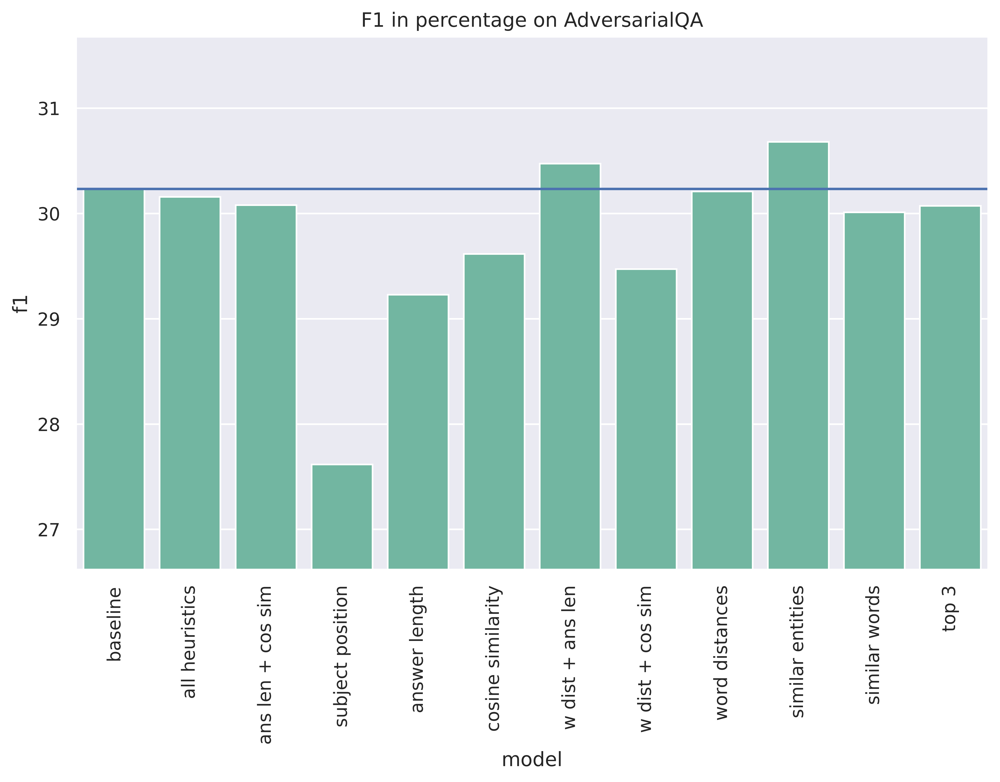

In [115]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="f1", data=dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'AdversarialQA') & (dataset_evals['model'] == 'baseline')]['f1'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA']['f1'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'AdversarialQA']['f1'].max() + 1)
plt.title('F1 in percentage on AdversarialQA')

Text(0.5, 1.0, 'F1 in percentage on NaturalQuestions')

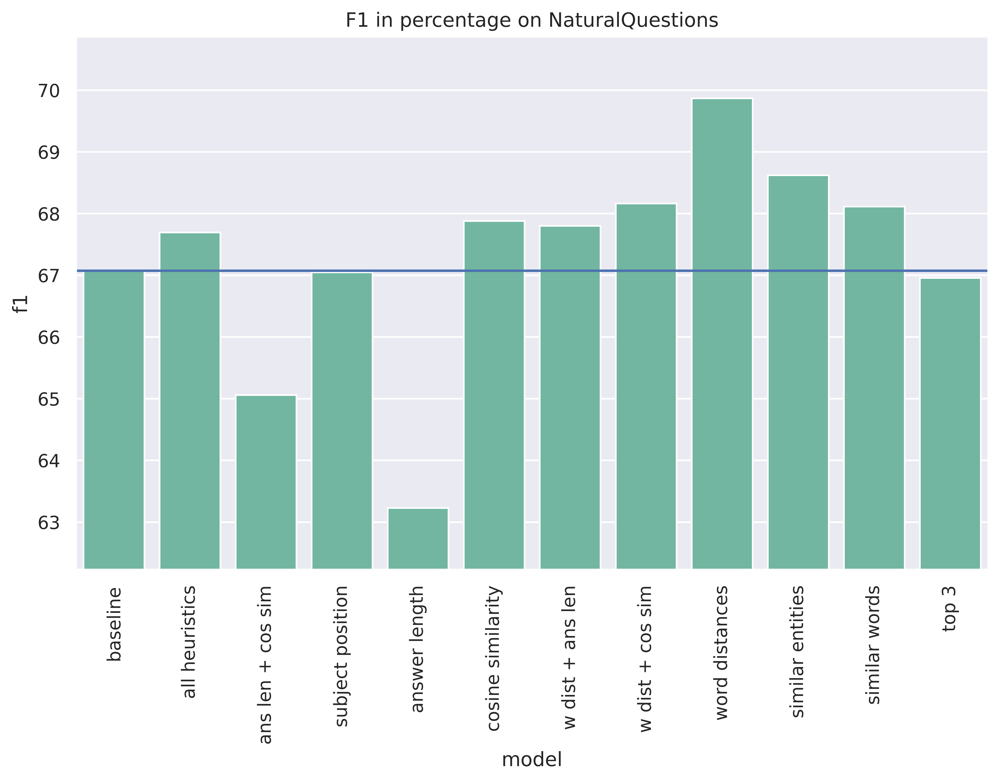

In [116]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="f1", data=dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'NaturalQuestions') & (dataset_evals['model'] == 'baseline')]['f1'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions']['f1'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'NaturalQuestions']['f1'].max() + 1)
plt.title('F1 in percentage on NaturalQuestions')

Text(0.5, 1.0, 'F1 in percentage on TriviaQA')

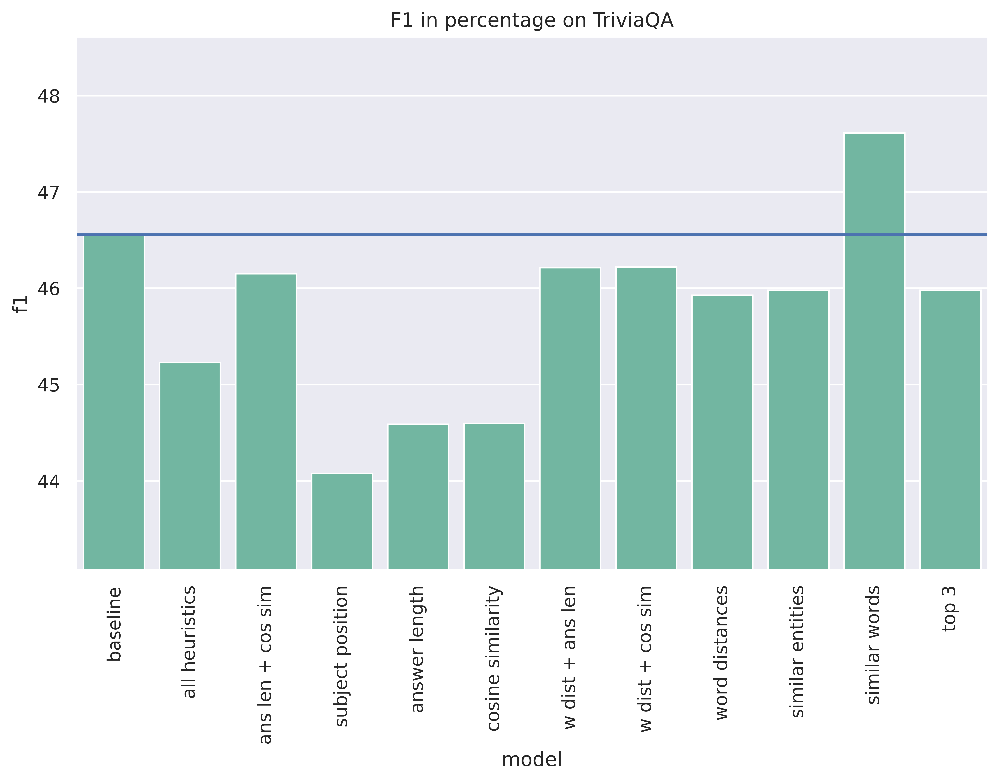

In [117]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="model", y="f1", data=dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA'], color='#66c2a5', ci=0).axhline(dataset_evals.loc[(dataset_evals['dataset'] == 'TriviaQA') & (dataset_evals['model'] == 'baseline')]['f1'].mean())
plt.xticks(rotation=90)
plt.ylim(dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA']['f1'].min() - 1, dataset_evals.loc[dataset_evals['dataset'] == 'TriviaQA']['f1'].max() + 1)
plt.title('F1 in percentage on TriviaQA')

In [118]:
dataset_evals.style

,dataset,model,exact_match,em_diff_from_base,f1,f1_diff_from_base,em_diff,f1_diff
0,AdversarialQA,baseline,19.233333,-0.633333,30.232718,-1.066529,0.000000,0.000000
1,AdversarialQA,all heuristics,18.611111,-1.255556,30.157232,-1.142016,-0.622222,-0.075486
2,AdversarialQA,ans len + cos sim,18.466667,-1.400000,30.079666,-1.219581,-0.766666,-0.153052
3,AdversarialQA,subject position,16.650000,-3.216667,27.617018,-3.682229,-2.583333,-2.615700
4,AdversarialQA,answer length,16.816667,-3.050000,29.229460,-2.069787,-2.416666,-1.003258
5,AdversarialQA,cosine similarity,18.383333,-1.483333,29.615994,-1.683253,-0.850000,-0.616724
6,AdversarialQA,w dist + ans len,18.533333,-1.333333,30.473379,-0.825868,-0.700000,0.240661
7,AdversarialQA,w dist + cos sim,18.616667,-1.250000,29.471279,-1.827968,-0.616666,-0.761439
8,AdversarialQA,word distances,18.533333,-1.333333,30.208991,-1.090256,-0.700000,-0.023727
9,AdversarialQA,similar entities,19.500000,-0.366667,30.679748,-0.619499,0.266667,0.447030


In [119]:
data_bootstrap = pd.read_csv('data_for_violin.csv', sep='\t')

In [120]:
data_bootstrap

,dataset,field,threshold,lower_interval_em,distance,higher_interval_em,lower_interval_f1,distance.1,higher_interval_f1,samples,sample_size,len_lower,len_higher,lower_em_list,higher_em_list,lower_f1_list,higher_f1_list
0,squad_base,distances,7.0,<79.559375;84.94687499999999>,8.803125,<66.809375;70.75625>,<87.77235558658447;91.40152502752235>,8.320067,<76.22736557912646;79.4522884272317>,100,800,8768,1651,83.750,lower,89.897915,lower
1,squad_base,distances,7.0,<79.559375;84.94687499999999>,8.803125,<66.809375;70.75625>,<87.77235558658447;91.40152502752235>,8.320067,<76.22736557912646;79.4522884272317>,100,800,8768,1651,69.250,higher,77.629814,higher
2,squad_base,distances,7.0,<79.559375;84.94687499999999>,8.803125,<66.809375;70.75625>,<87.77235558658447;91.40152502752235>,8.320067,<76.22736557912646;79.4522884272317>,100,800,8768,1651,81.500,lower,88.839393,lower
3,squad_base,distances,7.0,<79.559375;84.94687499999999>,8.803125,<66.809375;70.75625>,<87.77235558658447;91.40152502752235>,8.320067,<76.22736557912646;79.4522884272317>,100,800,8768,1651,67.750,higher,77.274989,higher
4,squad_base,distances,7.0,<79.559375;84.94687499999999>,8.803125,<66.809375;70.75625>,<87.77235558658447;91.40152502752235>,8.320067,<76.22736557912646;79.4522884272317>,100,800,8768,1651,83.000,lower,90.267656,lower
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,squad_base,answer_subject_positions,1.0,<79.434375;84.19687499999999>,0.803125,<74.309375;78.63125>,<87.20905025080224;90.15002352984881>,0.395787,<84.04309349736302;86.81326277989324>,100,800,5903,1672,75.000,higher,84.043013,higher
1396,squad_base,answer_subject_positions,1.0,<79.434375;84.19687499999999>,0.803125,<74.309375;78.63125>,<87.20905025080224;90.15002352984881>,0.395787,<84.04309349736302;86.81326277989324>,100,800,5903,1672,83.875,lower,89.308814,lower
1397,squad_base,answer_subject_positions,1.0,<79.434375;84.19687499999999>,0.803125,<74.309375;78.63125>,<87.20905025080224;90.15002352984881>,0.395787,<84.04309349736302;86.81326277989324>,100,800,5903,1672,77.500,higher,85.340968,higher
1398,squad_base,answer_subject_positions,1.0,<79.434375;84.19687499999999>,0.803125,<74.309375;78.63125>,<87.20905025080224;90.15002352984881>,0.395787,<84.04309349736302;86.81326277989324>,100,800,5903,1672,82.250,lower,88.245383,lower


In [121]:
data_bootstrap['dataset'][0]

'squad_base'

In [122]:
data_bootstrap.loc[data_bootstrap.field == 'distances', 'field'] = 'word distance'
data_bootstrap.loc[data_bootstrap.field == 'similar_words', 'field'] = 'similar words'
data_bootstrap.loc[data_bootstrap.field == 'answer_lenght', 'field'] = 'answer length'
data_bootstrap.loc[data_bootstrap.field == 'cosine_similarity', 'field'] = 'cosine similarity'
data_bootstrap.loc[data_bootstrap.field == 'kth_sentence', 'field'] = 'k-th sentence'
data_bootstrap.loc[data_bootstrap.field == 'max_sim_ents', 'field'] = 'similar entities'
data_bootstrap.loc[data_bootstrap.field == 'answer_subject_positions', 'field'] = 'subject positions'

In [123]:
data_em_violin = data_bootstrap[['field', 'lower_em_list', 'higher_em_list']].copy()

In [124]:
data_em_violin.rename(columns = {'field':'heuristic', 'lower_em_list':'exact match in percentage', 'higher_em_list':'subset'}, inplace = True)

In [125]:
data_em_violin

,heuristic,exact match in percentage,subset
0,word distance,83.750,lower
1,word distance,69.250,higher
2,word distance,81.500,lower
3,word distance,67.750,higher
4,word distance,83.000,lower
...,...,...,...
1395,subject positions,75.000,higher
1396,subject positions,83.875,lower
1397,subject positions,77.500,higher
1398,subject positions,82.250,lower


Text(0.5, 1.0, 'Distances between exact match intervals for subsets')

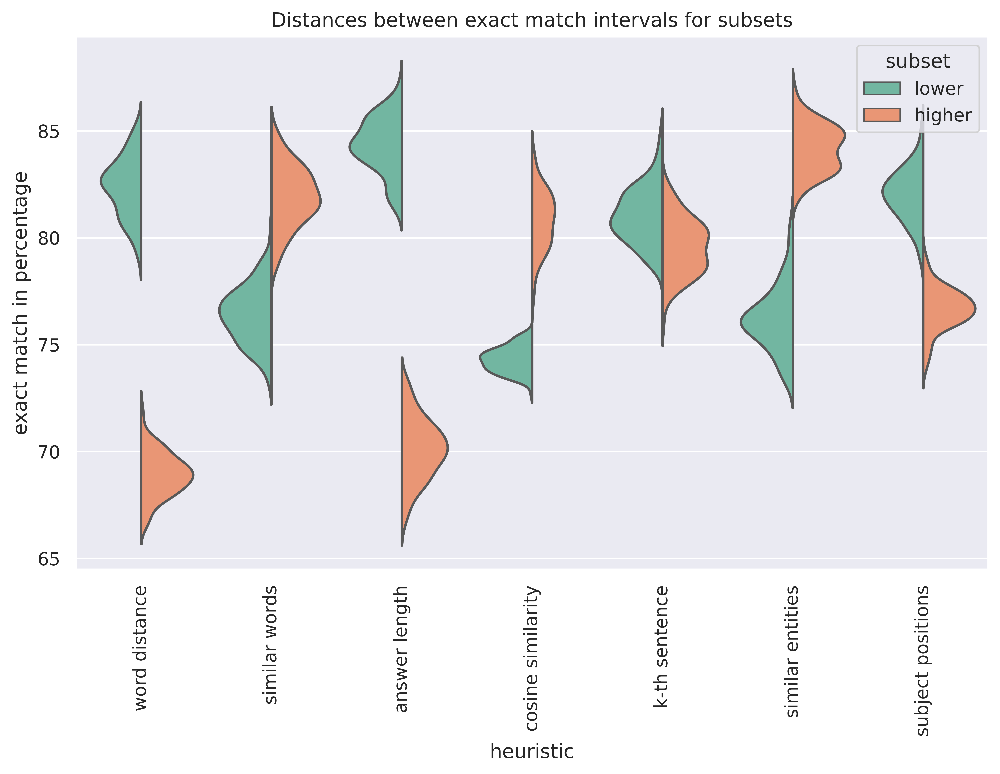

In [126]:
figure(figsize=(10, 6), dpi=800)
ax = sns.violinplot(x='heuristic', y="exact match in percentage", hue="subset",
                    data=data_em_violin, palette="Set2", split=True, inner=None)
plt.xticks(rotation=90)
plt.title('Distances between exact match intervals for subsets')

Text(0.5, 1.0, 'Distances between exact match intervals for subsets')

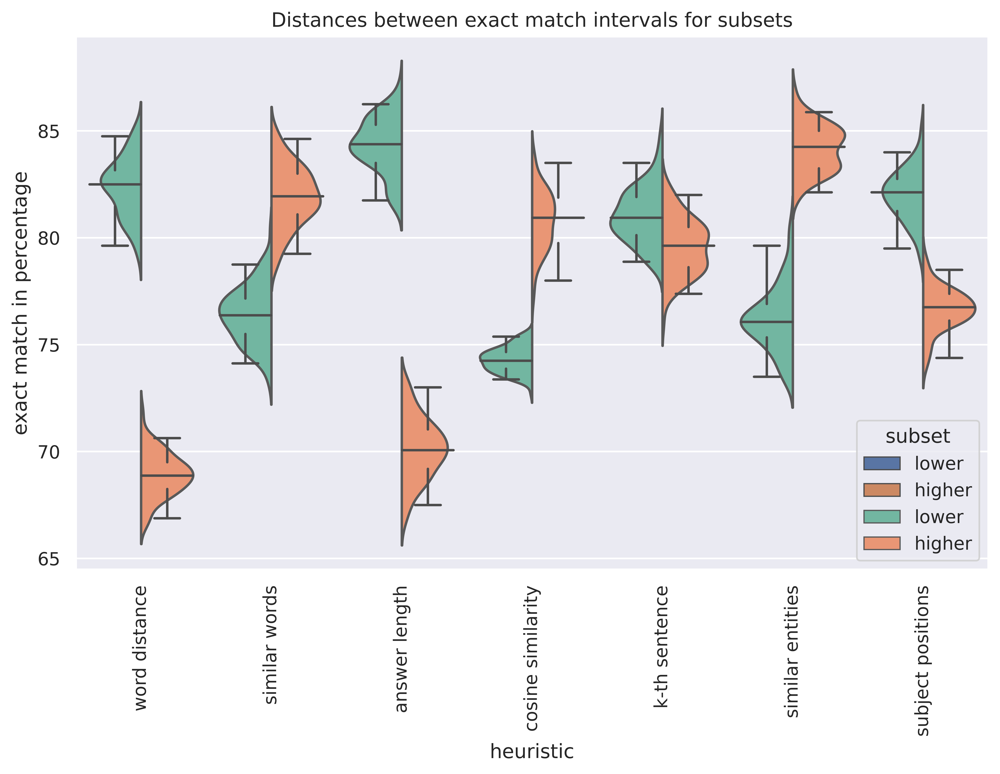

In [127]:
figure(figsize=(10, 6), dpi=800)
sns.boxplot(x='heuristic', y="exact match in percentage", hue="subset", data=data_em_violin, showfliers=False, showbox=False, whis=[2.5,97.5])
sns.violinplot(x='heuristic', y="exact match in percentage", hue="subset",
                    data=data_em_violin, palette="Set2", split=True, inner=None)
                    
plt.xticks(rotation=90)
plt.title('Distances between exact match intervals for subsets')

Text(0.5, 1.0, 'Distances between exact match intervals for subsets')

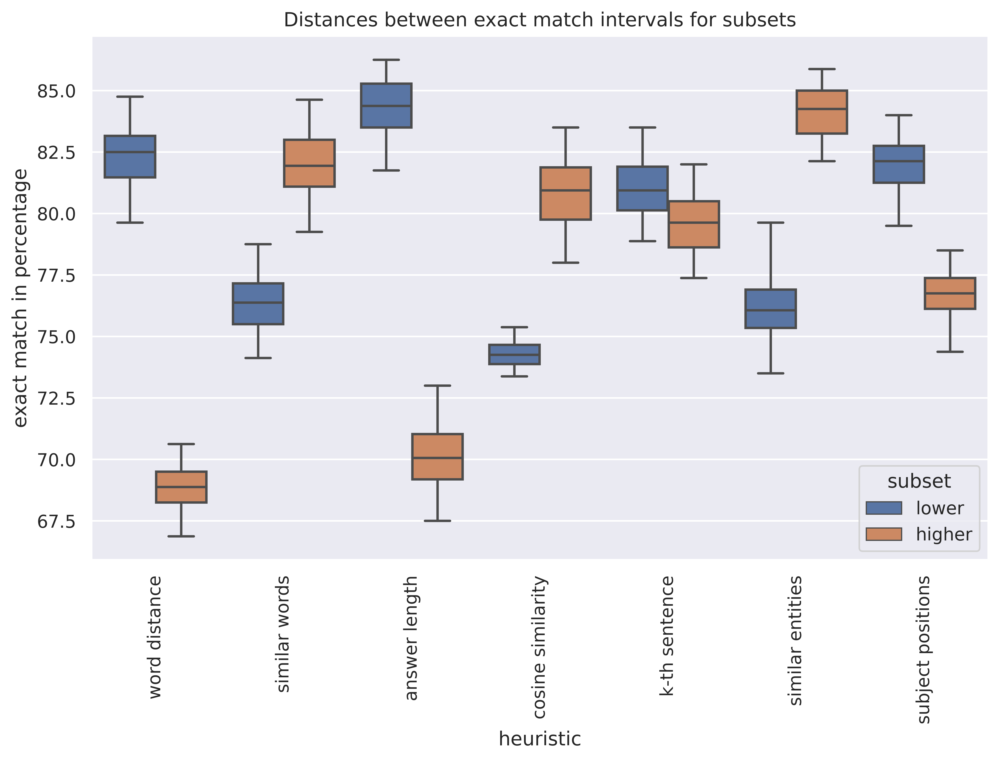

In [128]:
figure(figsize=(10, 6), dpi=800)
sns.boxplot(x='heuristic', y="exact match in percentage", hue="subset", data=data_em_violin, showfliers=False, whis=[2.5,97.5])

plt.xticks(rotation=90)
plt.title('Distances between exact match intervals for subsets')

In [129]:
data_f1_violin = data_bootstrap[['field', 'lower_f1_list', 'higher_f1_list']].copy()

In [130]:
data_f1_violin.rename(columns = {'field':'heuristic', 'lower_f1_list':'F1 in percentage', 'higher_f1_list':'subset'}, inplace = True)

Text(0.5, 1.0, 'Distances between F1 intervals for subsets')

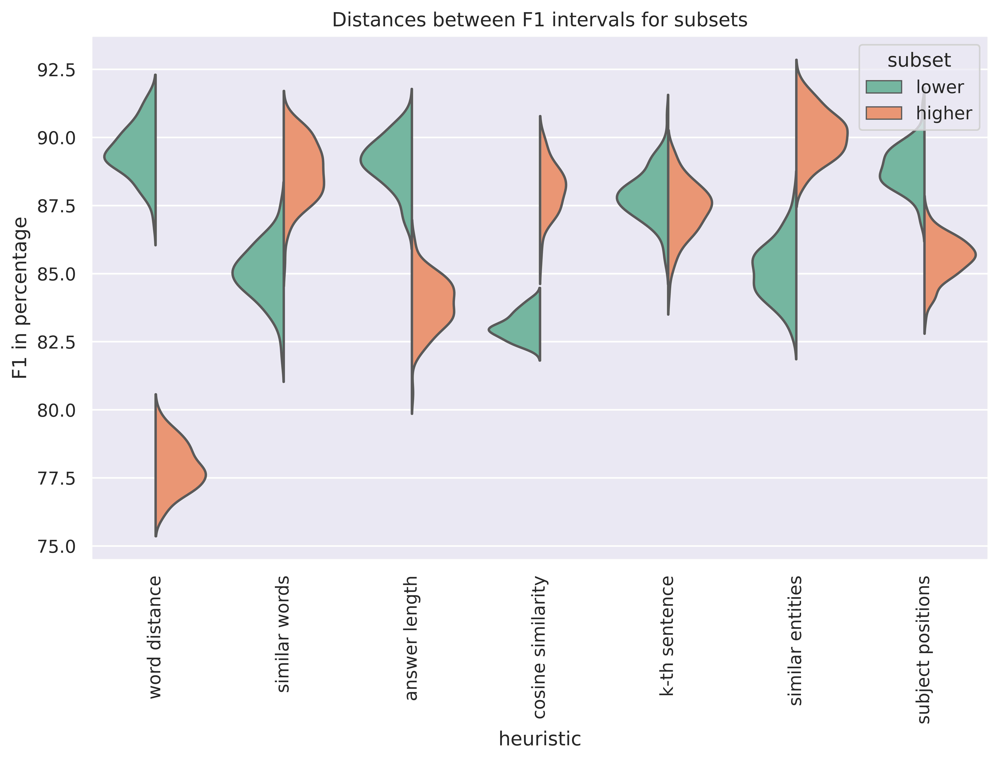

In [131]:
figure(figsize=(10, 6), dpi=800)
ax = sns.violinplot(x='heuristic', y="F1 in percentage", hue="subset",
                    data=data_f1_violin, palette="Set2", split=True, inner=None)
                    
plt.xticks(rotation=90)
plt.title('Distances between F1 intervals for subsets')

Text(0.5, 1.0, 'Distances between F1 intervals for subsets')

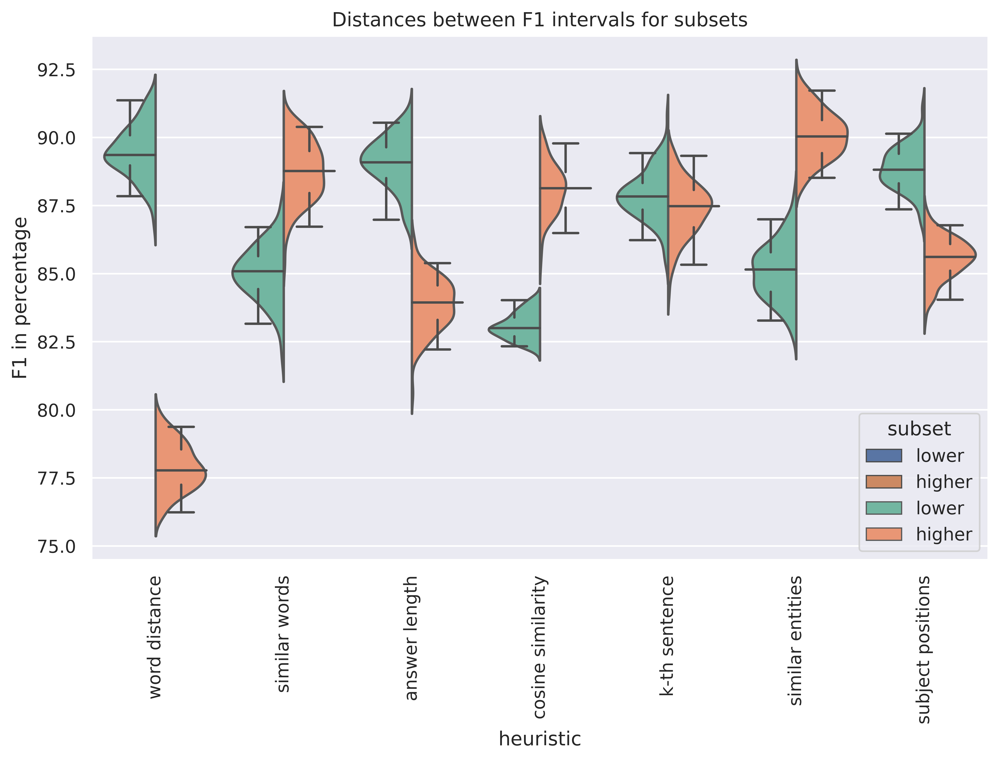

In [132]:
figure(figsize=(10, 6), dpi=800)
sns.boxplot(x='heuristic', y="F1 in percentage", hue="subset", data=data_f1_violin, showfliers=False, showbox=False, whis=[2.5,97.5])
sns.violinplot(x='heuristic', y="F1 in percentage", hue="subset",
                    data=data_f1_violin, palette="Set2", split=True, inner=None)
plt.xticks(rotation=90)
plt.title('Distances between F1 intervals for subsets')

Text(0.5, 1.0, 'Distances between F1 intervals for subsets')

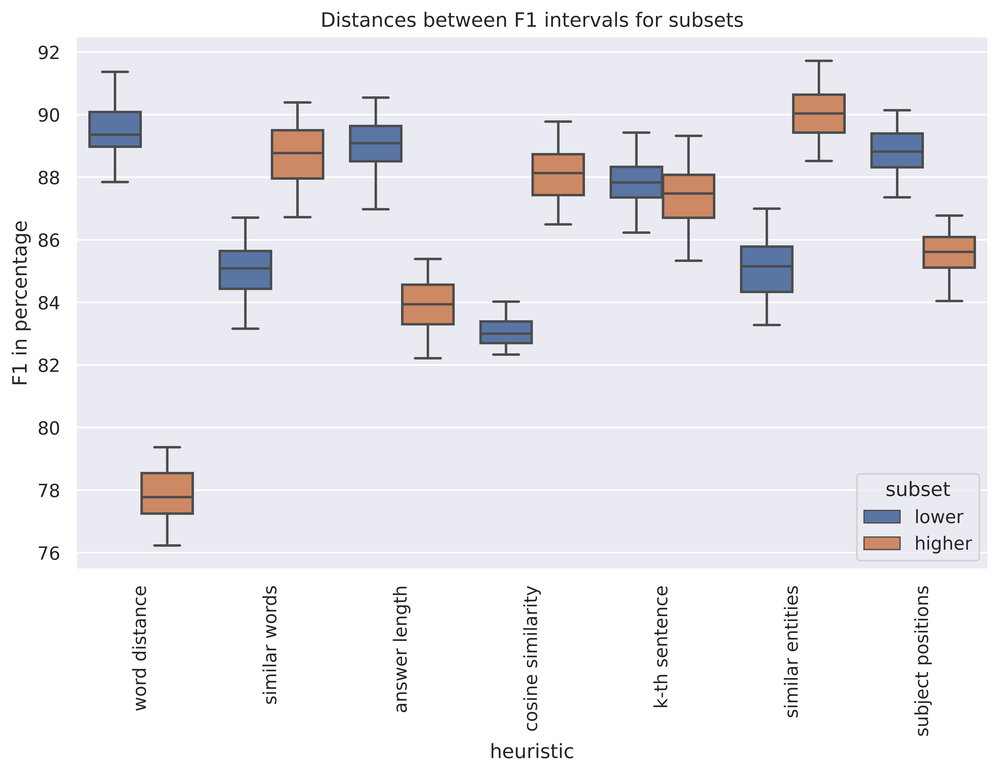

In [133]:
figure(figsize=(10, 6), dpi=800)
sns.boxplot(x='heuristic', y="F1 in percentage", hue="subset", showfliers=False, data=data_f1_violin, whis=[2.5,97.5])
plt.xticks(rotation=90)
plt.title('Distances between F1 intervals for subsets')

In [134]:
data_distances = pd.read_csv('./distance_differences.csv')

In [135]:
# data_distances['distance_em'] = data_distances['distance']
# data_distances['distance_f1'] = data_distances['distance']
data_distances_reduces = data_distances[['dataset', 'field']].copy()

In [136]:
data_distances_reduces.loc[data_distances_reduces.field == 'distances', 'field'] = 'word distance'
data_distances_reduces.loc[data_distances_reduces.field == 'similar_words', 'field'] = 'similar words'
data_distances_reduces.loc[data_distances_reduces.field == 'answer_lenght', 'field'] = 'answer length'
data_distances_reduces.loc[data_distances_reduces.field == 'cosine_similarity', 'field'] = 'cosine similarity'
data_distances_reduces.loc[data_distances_reduces.field == 'max_sim_ents', 'field'] = 'similar entities'
data_distances_reduces.loc[data_distances_reduces.field == 'answer_subject_positions', 'field'] = 'subject positions'

In [137]:
data_distances_reduces['distance_em'] = data_distances['distance']
data_distances_reduces['distance_f1'] = data_distances['distance.1']

In [138]:
data_distances_reduces.loc[(data_distances_reduces.dataset != 'squad_base'),'dataset']='supersampled'

In [139]:
data_distances_reduces = data_distances_reduces.groupby(by=["dataset", "field"], as_index=False).mean().sort_values(['distance_em','distance_f1'],ascending=False)

In [140]:
data_distances_reduces.rename(columns = {'field':'heuristic', 'distance_em':'distance (exact match)', 'distance_f1':'distance (F1)'}, inplace = True)

In [141]:
data_distances_reduces

,dataset,heuristic,distance (exact match),distance (F1)
0,squad_base,answer length,9.497917,1.638708
5,squad_base,word distance,8.620833,7.749390
11,supersampled,word distance,6.700000,6.129322
6,supersampled,answer length,4.007292,0.000000
1,squad_base,cosine similarity,2.634375,2.052554
2,squad_base,similar entities,2.481250,1.300698
7,supersampled,cosine similarity,1.991667,1.633588
8,supersampled,similar entities,1.618750,0.341916
4,squad_base,subject positions,1.007292,0.160522
3,squad_base,similar words,0.340625,0.000000


Text(0.5, 1.0, 'Comparison of interval distances between base model and supersampled models')

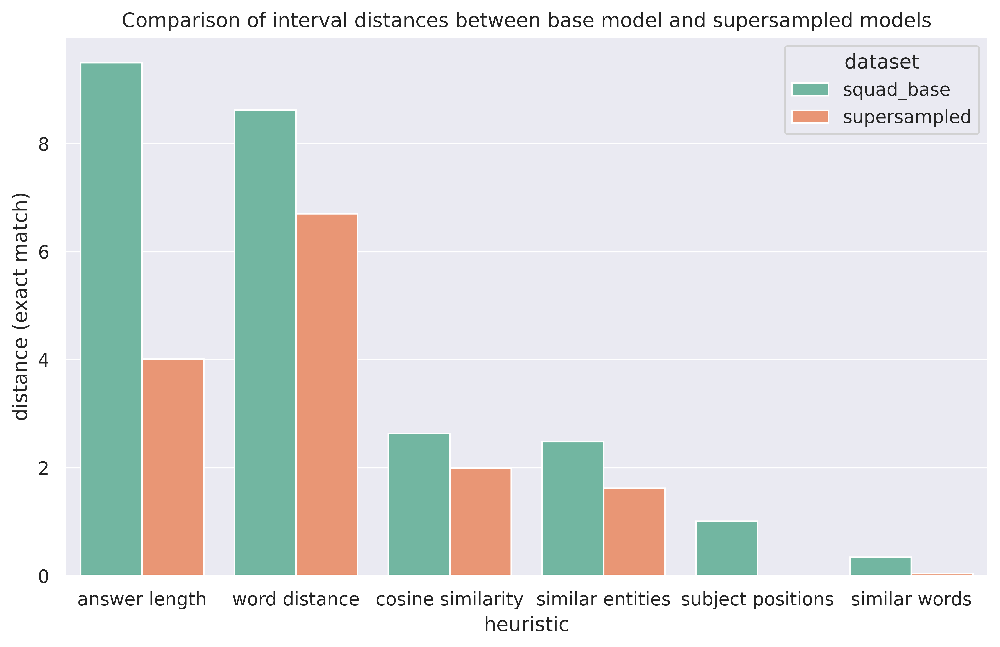

In [142]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="heuristic", y="distance (exact match)", hue="dataset", data=data_distances_reduces, palette="Set2",ci=0)
plt.title('Comparison of interval distances between base model and supersampled models')

Text(0.5, 1.0, 'Comparison of interval distances between base model and supersampled models')

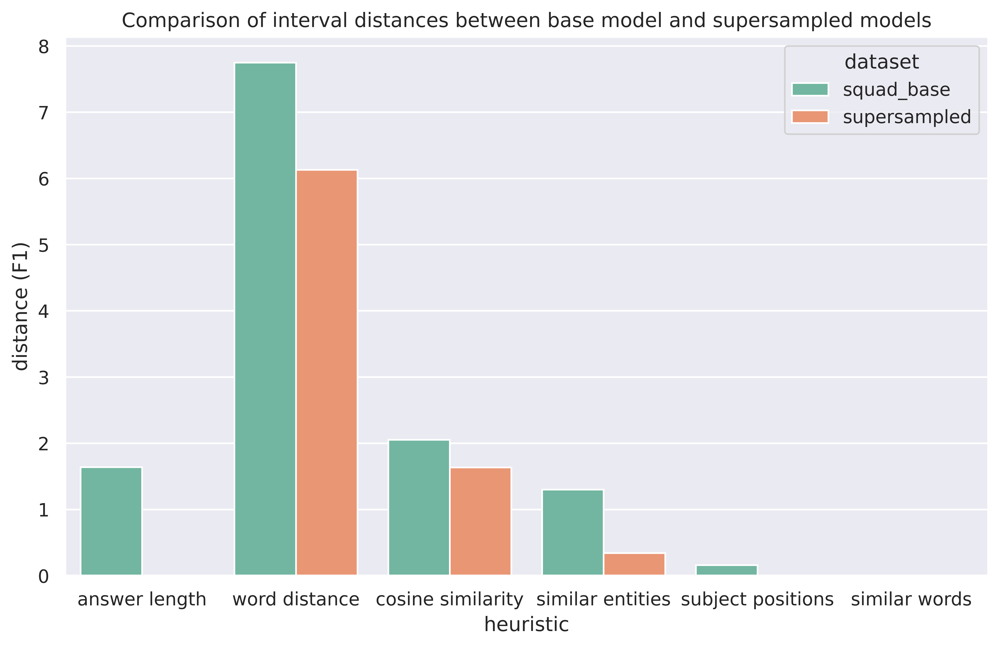

In [143]:
figure(figsize=(10, 6), dpi=800)
sns.barplot(x="heuristic", y="distance (F1)", hue="dataset", data=data_distances_reduces, palette="Set2",ci=0)
plt.title('Comparison of interval distances between base model and supersampled models')